In [1]:
import wfdb 
import matplotlib.pyplot as plt
import numpy as np
from hrv.filters import quotient, moving_median
from scipy import interpolate
from tqdm import tqdm
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [2]:
#define functions
def create_time_info(rri):
    # Return the cumulative sum of the RRI durations in the array
    rri_time = np.cumsum(rri) / 1000.0  # make it seconds
#     print("Cumulative time: " + str(rri_time))
#     print("RRI_time[0]: " + str(rri_time[0]))
    return rri_time - rri_time[0]   # force it to start at zero

def create_interp_time(rri, fs):
    time_rri = create_time_info(rri)
#     print("cummulative time from 0 in seconds: " + str(time_rri))
    #Values are generated within the half-open interval [start, stop) (in other words, the interval including start but excluding stop)
    return np.arange(0, time_rri[-1], 1 / float(fs))

def interp_cubic_spline(rri, fs):
    # create time scale from 0
    time_rri = create_time_info(rri)
#     print("cummulative time from 0 in seconds: " + str(time_rri))
    # create time scale with new sampling rate
    time_rri_interp = create_interp_time(rri, fs)
#     print("cummulative time after interpolation with new f: " + str(time_rri_interp))
    tck = interpolate.splrep(time_rri, rri, s=0)
    rri_interp = interpolate.splev(time_rri_interp, tck, der=0)
    return time_rri_interp, rri_interp

def interp_cubic_spline_qrs(qrs_index, qrs_amp, fs):
    time_qrs = qrs_index / float(FS)
    time_qrs = time_qrs - time_qrs[0]
    time_qrs_interp = np.arange(0, time_qrs[-1], 1/float(fs))
    tck = interpolate.splrep(time_qrs, qrs_amp, s=0)
    qrs_interp = interpolate.splev(time_qrs_interp, tck, der=0)
    return time_qrs_interp, qrs_interp

# get the amplitude of local R-peak,  Correct the peaks shifting them to local maxima
# min_bpm = 25
# max_bpm = 240, justify 
# Use the maximum possible bpm as the search radius,
# interval  = int(record.fs * 60 / max_bpm)
# INPUT: ECG, QRS - list of samples labled R-peak
# OUTPUT: a corresponding array of R-peak amplitude

# interval here means  if 2 peaks are very close, then get the max on (local R peak amp)
def get_qrs_amp(ecg, qrs):
    interval = int(FS * 0.250)
    qrs_amp = []
    for index in range(len(qrs)):
        curr_qrs = qrs[index]
        # Find local R peak amplitude
        amp = np.max(ecg[curr_qrs-interval:curr_qrs+interval])
        qrs_amp.append(amp)

    return qrs_amp

In [3]:
#read physio-ecg old_dataset
data_path = './apnea-ecg-database/'

train_data_name = ['a01', 'a02', 'a03', 'a04', 'a05',
             'a06', 'a07', 'a08', 'a09', 'a10',
             'a11', 'a12', 'a13', 'a14', 'a15',
             'a16', 'a17', 'a18', 'a19',
             'b01', 'b02', 'b03', 'b04',
             'c01', 'c02', 'c03', 'c04', 'c05',
             'c06', 'c07', 'c08', 'c09',
             ]

test_data_name = ['a20','b05','c10']

age = [51, 38, 54, 52, 58,
       63, 44, 51, 52, 58,
       58, 52, 51, 51, 60,
       44, 40, 52, 55, 58,
       44, 53, 53, 42, 52,
       31, 37, 39, 41, 28,
       28, 30, 42, 37, 27]

sex = [1, 1, 1, 1, 1,
       1, 1, 1, 1, 1,
       1, 1, 1, 1, 1,
       1, 1, 1, 1, 1,
       0, 1, 1, 1, 1,
       1, 1, 1, 0, 0,
       0, 0, 1, 1, 1]

In [4]:
# read new dataset 70 records
data_path = './apnea-ecg-database/'

train_data_name = ['a01', 'a02', 'a03', 'a04', 'a05',
             'a06', 'a07', 'a08', 'a09', 'a10',
             'a11', 'a12', 'a13', 'a14', 'a15',
             'a16', 'a17', 'a18', 'a19', 'a20',
             'b01', 'b02', 'b03', 'b04', 'b05',
             'c01', 'c02', 'c03', 'c04', 'c05',
             'c06', 'c07', 'c08', 'c09', 'c10',
             'x01', 'x02', 'x03', 'x04', 'x05', 
             'x06', 'x07', 'x08', 'x09', 'x10', 
             'x11', 'x12', 'x13', 'x14', 'x15',
             'x16', 'x17', 'x18', 'x19', 'x20', 
             'x21', 'x22', 'x23', 'x24', 'x25',
             ]

test_data_name = ['x26','x27','x28','x29','x30',
                  'x31','x32','x33','x34','x35']

age = [51, 38, 54, 52, 58,
       63, 44, 51, 52, 58,
       58, 52, 51, 51, 60,
       44, 40, 52, 55, 58,
       44, 53, 53, 42, 52,
       31, 37, 39, 41, 28,
       28, 30, 42, 37, 27, 
      44, 46, 44, 39, 55,
      31, 58, 55, 43, 39, 
      52, 40, 57, 38, 63,
      53, 27, 27, 54, 51,
      53, 27, 43, 31, 55, 
      57, 60, 60, 41, 44, 
      29, 29, 28, 30, 31]

sex = [1, 1, 1, 1, 1,
       1, 1, 1, 1, 1,
       1, 1, 1, 1, 1,
       1, 1, 1, 1, 1,
       0, 1, 1, 1, 1,
       1, 1, 1, 0, 0,
       0, 0, 1, 1, 1,
      1, 1, 0, 1, 1, 
      1, 1, 1, 1, 1,
      1, 1, 1, 1, 1,
      1, 0, 1, 1, 1,
      1, 0, 1, 1, 1, 
      1, 1, 1, 0, 1,
      0, 0, 0, 0, 1]

In [53]:
# TEST age mean + std
age_mean = np.mean(np.array(age))
print("Age mean: " + age_mean.astype(str))
age_std = np.std(np.array(age))
print("Age std: " + age_std.astype(str))

Age mean: 45.142857142857146
Age std: 10.760092557070998


In [57]:
# TEST AHI
AHI = [69.6,69.5,39.1,77.4,41,24.7,63,42,31.7,21,14,80.2,42,54.7,52,41,33,82.4,34,41,0.24,19,24,0.7,5,0,
      0,0,0,0,0.25,0,0,0,0,63,37.7,0.13,0,34,0,21,48,18.5,10,5,33,18.7,79.5,15.9,24,0,0,56.2,43,19,0,14.3,
      0,48,15.1,75,75,0,41,93.5,71.8,0.13,0.38,0]
AHI = np.array(AHI)
print(AHI)
print("AHI mean:" + np.mean(AHI).astype(str))
print("AHI std:" + np.std(AHI).astype(str))

[69.6  69.5  39.1  77.4  41.   24.7  63.   42.   31.7  21.   14.   80.2
 42.   54.7  52.   41.   33.   82.4  34.   41.    0.24 19.   24.    0.7
  5.    0.    0.    0.    0.    0.    0.25  0.    0.    0.    0.   63.
 37.7   0.13  0.   34.    0.   21.   48.   18.5  10.    5.   33.   18.7
 79.5  15.9  24.    0.    0.   56.2  43.   19.    0.   14.3   0.   48.
 15.1  75.   75.    0.   41.   93.5  71.8   0.13  0.38  0.  ]
AHI mean:28.04757142857143
AHI std:27.340373047706485


In [5]:
# define variables
# ECG_RAW_FREQUENCY
FS = 100.0
MARGIN = 10
FS_INTP = 4
MAX_HR = 300.0
MIN_HR = 20.0

MIN_RRI = 1.0 / (MAX_HR / 60.0) * 1000 #20ms
MAX_RRI = 1.0 / (MIN_HR / 60.0) * 1000 #3000ms
train_input_array = []
train_label_array = []

In [33]:
test_data_name

['x26', 'x27', 'x28', 'x29', 'x30', 'x31', 'x32', 'x33', 'x34', 'x35']

In [34]:
#TEST mean and std of records duration
data_index = 0
duration = []
for data_index in range(len(train_data_name)):
    win_num = len(wfdb.rdann(os.path.join(data_path,train_data_name[data_index]), 'apn').symbol)
    print (train_data_name[data_index] + " " +  str(win_num))
    duration.append(win_num)

data_index = 0   
for data_index in range(len(test_data_name)):
    win_num = len(wfdb.rdann(os.path.join(data_path,test_data_name[data_index]), 'apn').symbol)
    print (test_data_name[data_index] + " " +  str(win_num))
    duration.append(win_num)
    
print(len(duration))
duration = np.array(duration)
print("Mean: ", np.mean(duration))
print("Std: ", np.std(duration))

a01 489
a02 528
a03 519
a04 492
a05 454
a06 510
a07 511
a08 501
a09 495
a10 517
a11 466
a12 577
a13 495
a14 509
a15 510
a16 482
a17 485
a18 489
a19 502
a20 510
b01 487
b02 517
b03 441
b04 429
b05 433
c01 484
c02 502
c03 454
c04 482
c05 466
c06 468
c07 429
c08 513
c09 468
c10 431
x01 523
x02 469
x03 465
x04 482
x05 505
x06 450
x07 509
x08 517
x09 508
x10 510
x11 457
x12 527
x13 506
x14 490
x15 498
x16 515
x17 400
x18 459
x19 487
x20 513
x21 510
x22 482
x23 527
x24 429
x25 510
x26 520
x27 498
x28 495
x29 470
x30 511
x31 557
x32 538
x33 473
x34 475
x35 483
70
Mean:  490.1857142857143
Std:  31.57498687123033


In [7]:
type(win_num)

int

In [44]:
# TEST men +std of apnea duration
data_index = 0
duration = []
for data_index in range(len(train_data_name)):
    event = wfdb.rdann(os.path.join(data_path,train_data_name[data_index]), 'apn').symbol
    event = np.array(event)
    count = (event == 'A').sum()
    duration.append(count)

data_index = 0   
for data_index in range(len(test_data_name)):
    event = wfdb.rdann(os.path.join(data_path,test_data_name[data_index]), 'apn').symbol
    event = np.array(event)
    count = (event == 'A').sum()
    duration.append(count)
    
print(duration)
duration = np.array(duration)
print("Mean: ", np.mean(duration))
print("Std: ", np.std(duration))

# data_index = 0
# event = wfdb.rdann(os.path.join(data_path,train_data_name[data_index]), 'apn').symbol
# event = np.array(event)
# count = (event == 'A').sum()
# print(count)

[470, 420, 246, 453, 276, 206, 322, 189, 381, 100, 222, 534, 244, 383, 368, 320, 158, 438, 205, 315, 19, 93, 73, 10, 57, 0, 1, 0, 0, 3, 1, 4, 0, 2, 1, 375, 209, 12, 0, 316, 0, 240, 324, 167, 96, 13, 57, 292, 439, 200, 65, 1, 2, 407, 264, 120, 2, 119, 1, 291, 344, 487, 433, 0, 326, 516, 425, 3, 4, 0]
Mean:  186.62857142857143
Std:  170.99466753829086


In [10]:
#TEST
signals, fields = wfdb.rdsamp(os.path.join(data_path,train_data_name[data_index]))
signals



array([[-0.06 ],
       [-0.065],
       [-0.06 ],
       ...,
       [ 0.   ],
       [ 0.   ],
       [ 0.   ]])

In [11]:
len(signals)

2957000

In [12]:
fields

{'fs': 100,
 'sig_len': 2957000,
 'n_sig': 1,
 'base_date': None,
 'base_time': None,
 'units': ['mV'],
 'sig_name': ['ECG'],
 'comments': []}

In [ ]:
# Log records information
# a1 2957000
# 

In [34]:
#TEST

# fields
for index in tqdm(range(1, 2)):
    # determine a window sample (1 minute). E.x after 1 minute samp_from = 6000, samp_to = 12000
    samp_from = index * 60 * FS # 60 seconds
    samp_to = samp_from + 60 * FS  # 60 seconds
    
    # read a QRS annotation file and return an array of samples labeled "QRS" from "samp_from" to "samp_to"
    qrs_ann = wfdb.rdann(data_path + train_data_name[data_index], 'qrs', sampfrom=samp_from - (MARGIN*100) , sampto=samp_to + (MARGIN*100)).sample
    # return lable (N or A) of a unit window (1 minute)
    apn_ann = wfdb.rdann(data_path + train_data_name[data_index], 'apn', sampfrom=samp_from, sampto=samp_to-1).symbol
    print(len(qrs_ann))
    print(apn_ann[0])
    print(qrs_ann)

100%|██████████| 1/1 [00:00<00:00, 154.40it/s]

93
N
[ 5072  5161  5254  5344  5434  5525  5616  5704  5792  5885  5974  6062
  6153  6242  6329  6419  6503  6586  6669  6761  6848  6934  7018  7105
  7189  7273  7358  7441  7520  7601  7685  7769  7850  7928  8007  8092
  8178  8270  8356  8437  8517  8598  8683  8771  8856  8938  9015  9089
  9160  9230  9308  9391  9479  9566  9651  9734  9816  9900  9980 10059
 10137 10224 10308 10397 10477 10556 10643 10735 10823 10908 10991 11076
 11168 11262 11351 11436 11518 11601 11686 11771 11851 11933 12023 12115
 12202 12285 12373 12465 12558 12650 12739 12831 12925]


In [13]:
apn_ann = wfdb.rdann(data_path + train_data_name[data_index], 'apn')
apn_ann.ann_len

489

In [11]:
#TEST
qrs_amp = get_qrs_amp(signals, qrs_ann)
print(qrs_amp)
# list of diff of samples. e.x 89 samples in the first rri
rri = np.diff(qrs_ann)
print(rri)
# compute duration of each rri in ms
rri_ms = rri.astype('float') / FS * 1000.0
#https://github.com/marianpetruk/ECG_analysis/blob/master/ECG_analysis.ipynb
print(rri_ms)
print(len(rri_ms))

[1.325, 1.435, 1.5, 1.645, 1.745, 1.73, 1.61, 1.46, 1.475, 1.62, 1.595, 1.7, 1.545, 1.675, 1.605, 1.72, 1.615, 1.53, 1.53, 1.68, 1.445, 1.655, 1.595, 1.545, 1.605, 1.375, 1.695, 1.28, 1.525, 1.67, 1.67, 1.44, 1.535, 1.615, 1.69, 1.555, 1.74, 1.335, 1.31, 1.675, 1.44, 1.605, 1.725, 1.49, 1.445, 1.5, 1.345, 1.69, 1.565, 1.21, 1.53, 1.645, 1.58, 1.475, 1.565, 1.52, 1.425, 1.59, 1.415, 1.735, 1.47, 1.315, 1.435, 1.585, 1.49, 1.405, 1.62, 1.395, 1.645, 1.475, 1.385, 1.33, 1.53, 1.735, 1.53, 1.275, 1.545, 1.385, 1.305, 1.65, 1.63, 1.435, 1.72, 1.54, 1.35, 1.4, 1.475, 1.735, 1.425, 1.51, 1.465, 1.675, 1.55]
[89 93 90 90 91 91 88 88 93 89 88 91 89 87 90 84 83 83 92 87 86 84 87 84
 84 85 83 79 81 84 84 81 78 79 85 86 92 86 81 80 81 85 88 85 82 77 74 71
 70 78 83 88 87 85 83 82 84 80 79 78 87 84 89 80 79 87 92 88 85 83 85 92
 94 89 85 82 83 85 85 80 82 90 92 87 83 88 92 93 92 89 92 94]
[890. 930. 900. 900. 910. 910. 880. 880. 930. 890. 880. 910. 890. 870.
 900. 840. 830. 830. 920. 870. 860. 840.

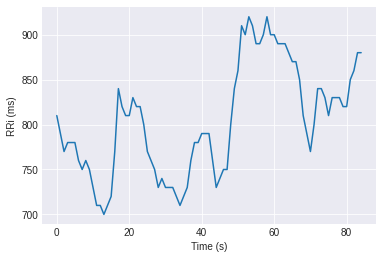

In [27]:
fig, ax = plt.subplots(1, 1)
ax.plot(rri_ms)
ax.set(xlabel="Time (s)", ylabel="RRi (ms)")
plt.show()

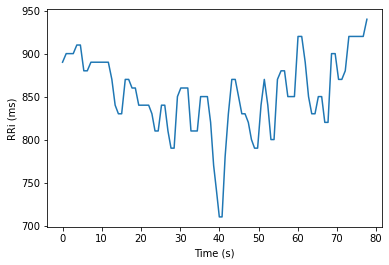

RRi array([890., 900., 900., 900., 910., 910., 880., 880., 890., 890., 890.,
       890., 890., 890., 870., 840., 830., 830., 870., 870., 860., 860.,
       840., 840., 840., 840., 830., 810., 810., 840., 840., 810., 790.,
       790., 850., 860., 860., 860., 810., 810., 810., 850., 850., 850.,
       820., 770., 740., 710., 710., 780., 830., 870., 870., 850., 830.,
       830., 820., 800., 790., 790., 840., 870., 840., 800., 800., 870.,
       880., 880., 850., 850., 850., 920., 920., 890., 850., 830., 830.,
       850., 850., 820., 820., 900., 900., 870., 870., 880., 920., 920.,
       920., 920., 920., 940.])
92


In [13]:
#TEST
rri_filt1 = moving_median(rri_ms)
rri_filt1.plot()
print(rri_filt1)
print(len(rri_filt1))

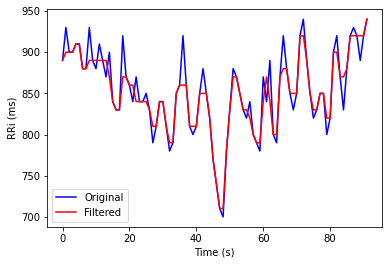

In [14]:
#TEST before and after filtering
fig, ax = plt.subplots(1, 1)
ax.plot(rri_ms,label="Original", color='blue')
ax.set(xlabel="Time (s)", ylabel="RRi (ms)")
ax.plot(rri_filt1,label="Filtered", color='red')
plt.legend()
plt.show()

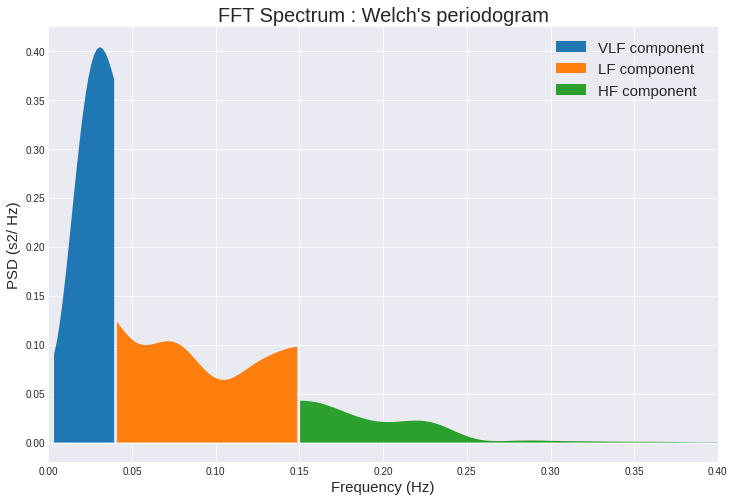

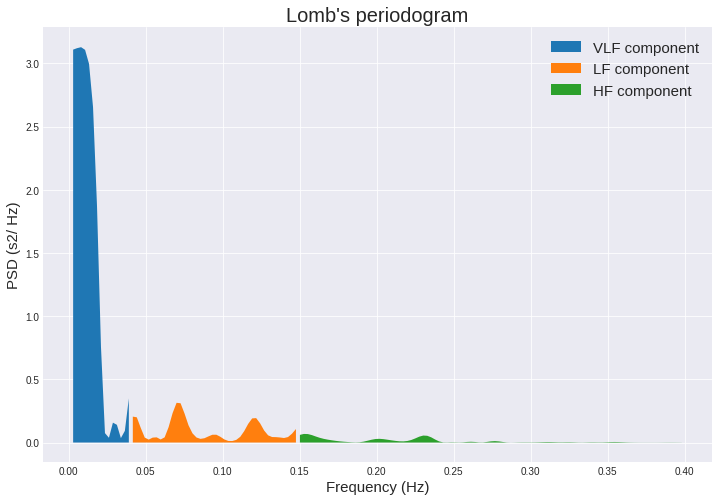

In [15]:
from hrvanalysis import plot_psd
plot_psd(rri_filt1, method="welch")
plot_psd(rri_filt1, method="lomb")

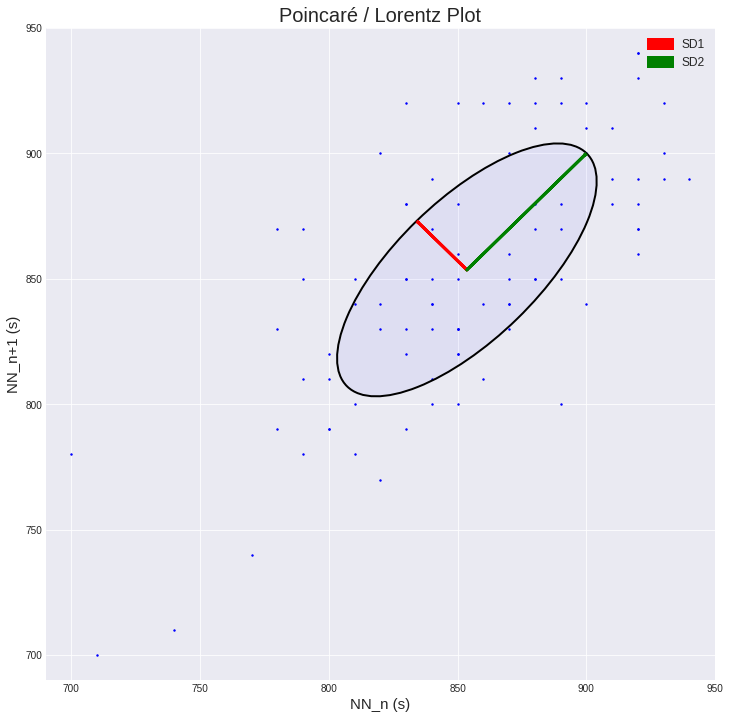

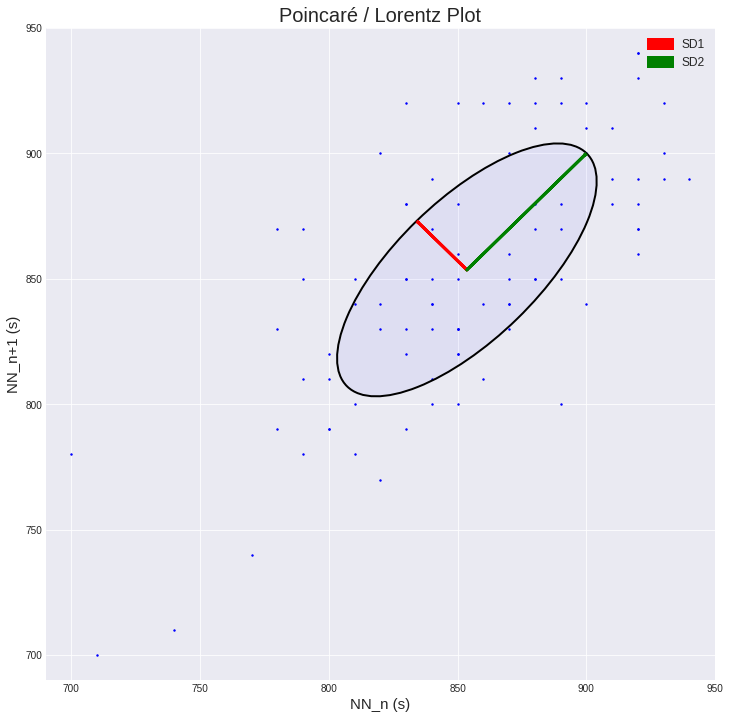

In [16]:
from hrvanalysis import plot_poincare
plot_poincare(rri_ms)
plot_poincare(rri_ms, plot_sd_features=True)

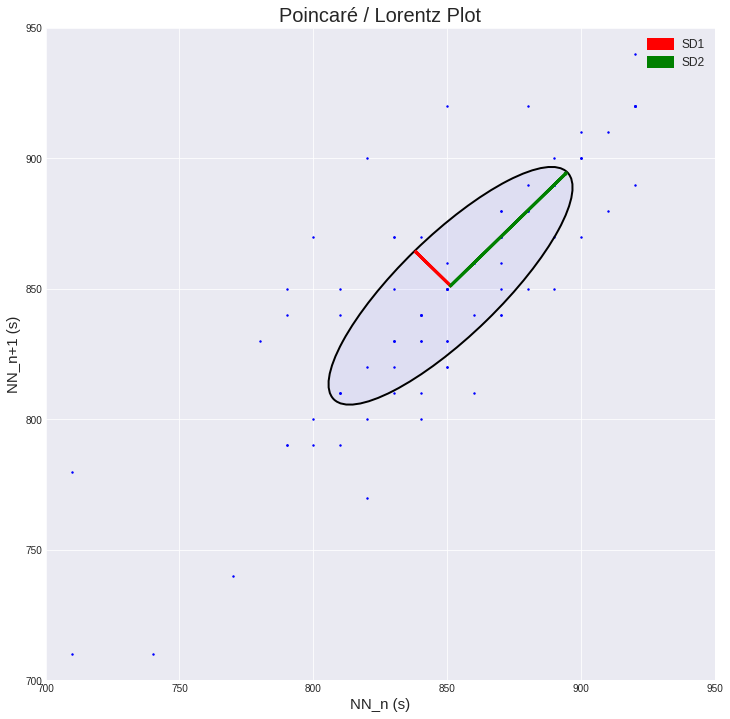

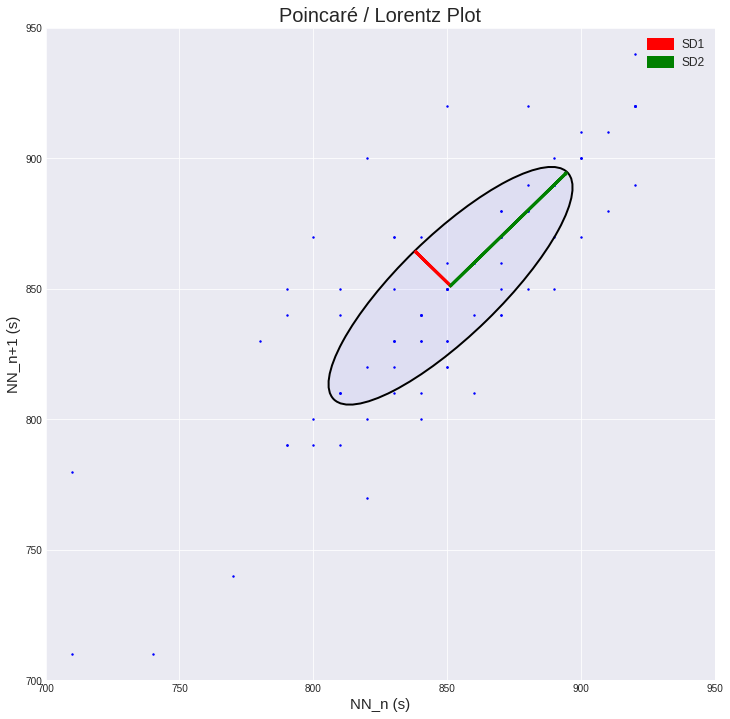

In [17]:
from hrvanalysis import plot_poincare
plot_poincare(rri_filt1)
plot_poincare(rri_filt1, plot_sd_features=True)

In [18]:
#TEST
time_rri1 = create_time_info(rri_filt1)
print("LENGH: " + str(len(time_rri1)))
print("Force it to start at zero: " + str(time_rri1))


LENGH: 92
Force it to start at zero: [ 0.    0.9   1.8   2.7   3.61  4.52  5.4   6.28  7.17  8.06  8.95  9.84
 10.73 11.62 12.49 13.33 14.16 14.99 15.86 16.73 17.59 18.45 19.29 20.13
 20.97 21.81 22.64 23.45 24.26 25.1  25.94 26.75 27.54 28.33 29.18 30.04
 30.9  31.76 32.57 33.38 34.19 35.04 35.89 36.74 37.56 38.33 39.07 39.78
 40.49 41.27 42.1  42.97 43.84 44.69 45.52 46.35 47.17 47.97 48.76 49.55
 50.39 51.26 52.1  52.9  53.7  54.57 55.45 56.33 57.18 58.03 58.88 59.8
 60.72 61.61 62.46 63.29 64.12 64.97 65.82 66.64 67.46 68.36 69.26 70.13
 71.   71.88 72.8  73.72 74.64 75.56 76.48 77.42]


In [19]:
time_rri_interp1 = create_interp_time(rri_filt1, FS_INTP)
print("last rri in the list: " + str(time_rri1[-1]))
print("create rri from 0 to the last rri with new FS_INTP: " + str(time_rri_interp1))

last rri in the list: 77.42
create rri from 0 to the last rri with new FS_INTP: [ 0.    0.25  0.5   0.75  1.    1.25  1.5   1.75  2.    2.25  2.5   2.75
  3.    3.25  3.5   3.75  4.    4.25  4.5   4.75  5.    5.25  5.5   5.75
  6.    6.25  6.5   6.75  7.    7.25  7.5   7.75  8.    8.25  8.5   8.75
  9.    9.25  9.5   9.75 10.   10.25 10.5  10.75 11.   11.25 11.5  11.75
 12.   12.25 12.5  12.75 13.   13.25 13.5  13.75 14.   14.25 14.5  14.75
 15.   15.25 15.5  15.75 16.   16.25 16.5  16.75 17.   17.25 17.5  17.75
 18.   18.25 18.5  18.75 19.   19.25 19.5  19.75 20.   20.25 20.5  20.75
 21.   21.25 21.5  21.75 22.   22.25 22.5  22.75 23.   23.25 23.5  23.75
 24.   24.25 24.5  24.75 25.   25.25 25.5  25.75 26.   26.25 26.5  26.75
 27.   27.25 27.5  27.75 28.   28.25 28.5  28.75 29.   29.25 29.5  29.75
 30.   30.25 30.5  30.75 31.   31.25 31.5  31.75 32.   32.25 32.5  32.75
 33.   33.25 33.5  33.75 34.   34.25 34.5  34.75 35.   35.25 35.5  35.75
 36.   36.25 36.5  36.75 37.   37.25 37.5  3

In [20]:
#TEST
tck1 = interpolate.splrep(time_rri1, rri_filt1, s=0)
print(tck1)

(array([ 0.  ,  0.  ,  0.  ,  0.  ,  1.8 ,  2.7 ,  3.61,  4.52,  5.4 ,
        6.28,  7.17,  8.06,  8.95,  9.84, 10.73, 11.62, 12.49, 13.33,
       14.16, 14.99, 15.86, 16.73, 17.59, 18.45, 19.29, 20.13, 20.97,
       21.81, 22.64, 23.45, 24.26, 25.1 , 25.94, 26.75, 27.54, 28.33,
       29.18, 30.04, 30.9 , 31.76, 32.57, 33.38, 34.19, 35.04, 35.89,
       36.74, 37.56, 38.33, 39.07, 39.78, 40.49, 41.27, 42.1 , 42.97,
       43.84, 44.69, 45.52, 46.35, 47.17, 47.97, 48.76, 49.55, 50.39,
       51.26, 52.1 , 52.9 , 53.7 , 54.57, 55.45, 56.33, 57.18, 58.03,
       58.88, 59.8 , 60.72, 61.61, 62.46, 63.29, 64.12, 64.97, 65.82,
       66.64, 67.46, 68.36, 69.26, 70.13, 71.  , 71.88, 72.8 , 73.72,
       74.64, 75.56, 77.42, 77.42, 77.42, 77.42]), array([890.        , 901.88718668, 901.22562664, 897.3174006 ,
       910.61180245, 920.17797528, 870.28319854, 879.2838106 ,
       892.87917617, 889.25059513, 890.11844331, 890.27563162,
       888.7790302 , 894.56458303, 873.6189054 , 833.776701

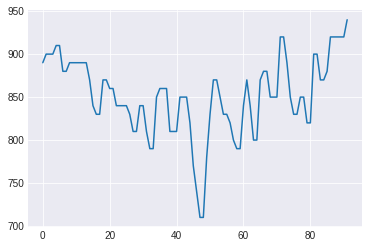

In [21]:
plt.plot(rri_filt1)
plt.show()

LENGH: 92
LENGH: 92


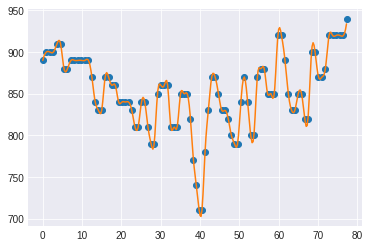

In [22]:
#TEST: visualize rri input array after interpolation
import matplotlib.pyplot as plt
from scipy.interpolate import splev, splrep
x = time_rri1
print("LENGH: " + str(len(x)))
y = rri_filt1
print("LENGH: " + str(len(y)))
spl = splrep(x, y)
x2 = time_rri_interp1
y2 = splev(x2, spl)
plt.plot(x, y, 'o', x2, y2)
plt.show()

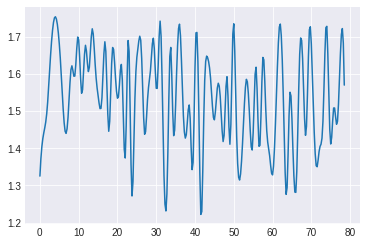

In [23]:
#TEST
qrs_time_intp1, qrs_intp1 = interp_cubic_spline_qrs(qrs_ann, qrs_amp, FS_INTP)
plt.plot(qrs_time_intp1, qrs_intp1)
plt.show()

In [ ]:
# make train input and train label data
for data_index in range(len(train_data_name)):
    print (train_data_name[data_index])
    win_num = len(wfdb.rdann(os.path.join(data_path,train_data_name[data_index]), 'apn').symbol)
    signals, fields = wfdb.rdsamp(os.path.join(data_path,train_data_name[data_index]))
    
    for index in tqdm(range(1, win_num)):
        # determine a window sample (1 minute). E.x after 1 minute samp_from = 6000, samp_to = 12000
        samp_from = index * 60 * FS # 60 seconds
        samp_to = samp_from + 60 * FS  # 60 seconds
        
        # read a QRS annotation file and return an array of samples labeled "QRS" from "samp_from" to "samp_to"
        qrs_ann = wfdb.rdann(data_path + train_data_name[data_index], 'qrs', sampfrom=samp_from - (MARGIN*100), sampto=samp_to + (MARGIN*100)).sample
        # return lable (N or A) of a unit window (1 minute)
        apn_ann = wfdb.rdann(data_path + train_data_name[data_index], 'apn', sampfrom=samp_from, sampto=samp_to-1).symbol

        # return an aray of the amplitude of local R-peak in qrs_ann | try other libs to find R peak, and compare to this results
        qrs_amp = get_qrs_amp(signals, qrs_ann)
        
        # return an array of RR-interval in the time window
        # RR interval = difference between adjacent R peak point positions
        rri = np.diff(qrs_ann)
        # using cubic spline interpolation to convert the non-equidistantly sampled RR interval time locations to an equidistanly 
        # sampled HRV signal that has amplitude equal to the RR interval signal at precisely that time location.
       
        # an array of duration of each interval in ms. e.x 89 samples has a duration of (89/f)*1000 ms
        rri_ms = rri.astype('float') / FS * 1000.0
        try:
            # filter methods which act directly on irregularly sampled signals can help to prevent the negative effects of resampling. 
            # check this in paper "Accurate detection of .....- Oliver Faust"
            # detrending and lowpass filter to reduce the DC bias (use PSD to view it). Removing DC bias helps to focus on the variability of the RR intervals
            
            #Since there are physiologically uninterpretable points in the generated RR intervals,  
            # follow Chen et al. L. Chen, X. Zhang, and C. Song, “An automatic screening approach for obstructive sleep apnea diagnosis based on single-lead electrocardiogram,” IEEE Transactions on Automation Science and Engineering, vol. 12, no. 1, pp. 106–115, 2015. using a median filter to eliminate those underlying abnormal values
            rri_filt = moving_median(rri_ms)
            
            # condition: at least 5 intervals, and the min of a interval duration in the list >= min_rri (25ms - 240 * 25 =6000 samples), and <= 3000ms
            # draw the figure before and after interpolation of rri 
            if len(rri_filt) > 5 and (np.min(rri_filt) >= MIN_RRI and np.max(rri_filt) <= MAX_RRI):
                
                time_intp, rri_intp = interp_cubic_spline(rri_filt, FS_INTP)
                
                qrs_time_intp, qrs_intp = interp_cubic_spline_qrs(qrs_ann, qrs_amp, FS_INTP)
                
                rri_intp = rri_intp[(time_intp >= MARGIN) & (time_intp < (60+MARGIN))]
                
                qrs_intp = qrs_intp[(qrs_time_intp >= MARGIN) & (qrs_time_intp < (60 + MARGIN))]
                #time_intp = time_intp[(time_intp >= MARGIN) & (time_intp < (60+MARGIN))]
                
                # check again, if len of rri intp not equal samples in 1 minute, then skip it
                if len(rri_intp) != (FS_INTP * 60):
                    skip = 1
                else:
                    skip = 0

                if skip == 0:
                    rri_intp = rri_intp - np.mean(rri_intp)
                    qrs_intp = qrs_intp - np.mean(qrs_intp)
                    # labeling based on the apn_ann 
                    # check annotation in each 1' window
                    if apn_ann[0] == 'N': # Normal
                        label = 0.0
                    elif apn_ann[0] == 'A': # Apnea
                        label = 1.0
                    else:
                        label = 2.0

                    train_input_array.append([rri_intp, qrs_intp, age[data_index], sex[data_index]])
                    train_label_array.append(label)
        except:
            hrv_module_error = 1

a01


100%|██████████| 488/488 [01:32<00:00,  5.27it/s]


a02


100%|██████████| 527/527 [01:54<00:00,  4.60it/s]


a03


100%|██████████| 518/518 [01:50<00:00,  4.70it/s]


a04


100%|██████████| 491/491 [01:38<00:00,  5.00it/s]


a05


100%|██████████| 453/453 [01:21<00:00,  5.54it/s]


a06


100%|██████████| 509/509 [01:30<00:00,  5.60it/s]


a07


100%|██████████| 510/510 [01:57<00:00,  4.32it/s]


a08


 17%|█▋        | 85/500 [00:04<00:36, 11.39it/s]

In [ ]:
np.save('new_train_input.npy', train_input_array)
np.save('new_train_label.npy', train_label_array)

In [51]:
print(train_input_array)
print(train_label_array)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [23]:
train_input_array

[[array([  50.71019562,   50.51093523,   50.50758476,   50.89908596,
           51.68017352,   52.20208714,   51.68963086,   49.38919905,
           45.00006269,   38.65134419,   30.4891619 ,   20.91474192,
           11.23454221,    2.95571558,   -2.56696531,   -5.66709867,
           -7.72937391,  -10.12391714,  -12.70127817,  -13.11804223,
           -8.85981316,    1.37463108,   14.5816497 ,   26.8031904 ,
           34.25187776,   36.14727278,   34.27978838,   30.52252864,
           26.50999608,   23.12481494,   21.10187828,   21.0605036 ,
           22.13758751,   22.44327729,   20.07295309,   14.35219206,
            7.35130345,    1.51197672,   -1.11612643,   -1.03556752,
            0.22951688,    1.18968086,    1.30218376,    1.02170076,
            0.85017418,    1.0602057 ,    1.28153154,    1.0320943 ,
           -0.14884378,   -2.54252411,   -6.3402752 ,  -11.71325118,
          -18.22697326,  -24.73859838,  -30.06563497,  -33.14409714,
          -33.17440088,  -29.39273

In [24]:
np.shape(train_input_array)

/home/mark/anaconda3/envs/gpu/lib/python3.6/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


(15129, 4)

In [25]:
train_label_array

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0

In [ ]:
# create test input
test_input_array = []
test_label_array = []
for data_index in range(len(test_data_name)):
    print (test_data_name[data_index])
    win_num = len(wfdb.rdann(os.path.join(data_path,test_data_name[data_index]), 'apn').symbol)
    signals, fields = wfdb.rdsamp(os.path.join(data_path,test_data_name[data_index]))
    for index in tqdm(range(1, win_num)):
        samp_from = index * 60 * FS # 60 seconds
        samp_to = samp_from + 60 * FS  # 60 seconds

        qrs_ann = wfdb.rdann(data_path + test_data_name[data_index], 'qrs', sampfrom=samp_from - (MARGIN*100), sampto=samp_to + (MARGIN*100)).sample
        apn_ann = wfdb.rdann(data_path + test_data_name[data_index], 'apn', sampfrom=samp_from, sampto=samp_to-1).symbol

        qrs_amp = get_qrs_amp(signals, qrs_ann)

        rri = np.diff(qrs_ann)
        rri_ms = rri.astype('float') / FS * 1000.0
        try:
            rri_filt = moving_median(rri_ms)

            if len(rri_filt) > 5 and (np.min(rri_filt) >= MIN_RRI and np.max(rri_filt) <= MAX_RRI):
                time_intp, rri_intp = interp_cubic_spline(rri_filt, FS_INTP)
                qrs_time_intp, qrs_intp = interp_cubic_spline_qrs(qrs_ann, qrs_amp, FS_INTP)
                rri_intp = rri_intp[(time_intp >= MARGIN) & (time_intp < (60+MARGIN))]
                qrs_intp = qrs_intp[(qrs_time_intp >= MARGIN) & (qrs_time_intp < (60 + MARGIN))]
                #time_intp = time_intp[(time_intp >= MARGIN) & (time_intp < (60+MARGIN))]

                if len(rri_intp) != (FS_INTP * 60):
                    skip = 1
                else:
                    skip = 0

                if skip == 0:
                    rri_intp = rri_intp - np.mean(rri_intp)
                    qrs_intp = qrs_intp - np.mean(qrs_intp)
                    if apn_ann[0] == 'N': # Normal
                        label = 0.0
                    elif apn_ann[0] == 'A': # Apnea
                        label = 1.0
                    else:
                        label = 2.0

                    test_input_array.append([rri_intp, qrs_intp, age[data_index], sex[data_index]])
                    test_label_array.append(label)
        except:
            hrv_module_error = 1
np.save('new_test_input.npy', test_input_array)
np.save('new_test_label.npy', test_label_array)